In [1]:
import sys
import os
import platform
import importlib
import glob
import pandas as pd
import numpy as np
import netCDF4
from datetime import datetime, timedelta
from joblib import Parallel, delayed
from tqdm import tqdm
import matplotlib.pyplot as plt
if platform.system() == 'Darwin':  # macOS
    base_FP = '/Users/subin/data'
    cpuserver_data_FP = '/Users/subin/cpuserver_data'
elif platform.system() == 'Linux':
    base_FP = '/home/subin/data'
    cpuserver_data_FP = '/home/subin/cpuserver_data'
else:
    base_FP = '/home/subin/data'
    cpuserver_data_FP = '/data'
sys.path.append(base_FP + '/python_modules')
print(base_FP, cpuserver_data_FP)

#hydroAI libs
import HydroAI.ASCAT_TUW as hASCAT_TUW
import HydroAI.Plot as hPlot
import HydroAI.Data as hData
import HydroAI.Grid as hGrid
import HydroAI.AMSR2_LPRM as hAMSR2_LPRM
import HydroAI.SMOS_CATDS as hSMOS_CATDS
import HydroAI.ERA5_land as hERA5_land
importlib.reload(hASCAT_TUW)
importlib.reload(hPlot)
importlib.reload(hData)
importlib.reload(hGrid)
importlib.reload(hAMSR2_LPRM)
importlib.reload(hSMOS_CATDS)
importlib.reload(hERA5_land)
# Ignore runtime warnings
import warnings
warnings.filterwarnings("ignore")

import Slack.slack_notifier as Slack

env_path = os.path.join('/home/subin', '.env')
notifier = Slack.Notifier(env_path)
print(env_path)

/home/subin/data /home/subin/cpuserver_data
/home/subin/.env


In [2]:
year_start = 2015
year_finish = 2023
time_list = ['am', 'pm']

with netCDF4.Dataset(f'{cpuserver_data_FP}/extracted_nc/projects/2025_KMA_050_grid/ll_coord_720x360_regular.nc', 'r') as nc:
    print(nc.variables.keys())
    domain_lat = nc.variables['lats'][:].data
    domain_lon = nc.variables['lons'][:].data
    domain_lat = np.flip(domain_lat) # For start from 90 to -90
    domain_lon -= 180  # For start from -180 to 180
    domain_lon += 0.25 # For symmetric domain

# Create 2D arrays from 1D domain_lat and domain_lon
domain_lon, domain_lat = np.meshgrid(domain_lon, domain_lat)

print(domain_lat.shape, domain_lon.shape)

dict_keys(['lons', 'lats'])
(360, 720) (360, 720)


In [3]:
# Check the domain_lat and domain_lon
print(domain_lat)
print(domain_lon)

[[ 89.75  89.75  89.75 ...  89.75  89.75  89.75]
 [ 89.25  89.25  89.25 ...  89.25  89.25  89.25]
 [ 88.75  88.75  88.75 ...  88.75  88.75  88.75]
 ...
 [-88.75 -88.75 -88.75 ... -88.75 -88.75 -88.75]
 [-89.25 -89.25 -89.25 ... -89.25 -89.25 -89.25]
 [-89.75 -89.75 -89.75 ... -89.75 -89.75 -89.75]]
[[-179.75 -179.25 -178.75 ...  178.75  179.25  179.75]
 [-179.75 -179.25 -178.75 ...  178.75  179.25  179.75]
 [-179.75 -179.25 -178.75 ...  178.75  179.25  179.75]
 ...
 [-179.75 -179.25 -178.75 ...  178.75  179.25  179.75]
 [-179.75 -179.25 -178.75 ...  178.75  179.25  179.75]
 [-179.75 -179.25 -178.75 ...  178.75  179.25  179.75]]


In [5]:
other_product_ET_dict = {
    'GLDAS_Noah': {'et': 'ET'},
    'GLDAS_VIC': {'et': 'ET'},
    'ERA5': {'et': 'ET'},
    'MERRA2': {'et': 'EVLAND'},
    'GLEAM_v38a': {'et': 'GLEAM_R_E'},
    'GLEAM_v42a': {'et': 'GLEAM_R_E'},
    'VISEA': {'et': 'VISEA_R_Et'}
    }

data_vars = {}
for year in range(year_start, year_finish + 1):
    # For other products (ET)
    for product, variable_dict in other_product_ET_dict.items():
        nc_file = f'{cpuserver_data_FP}/extracted_nc/{product}/{product}_{year}_R_eqd_050.nc'
        try:
            with netCDF4.Dataset(nc_file) as nc_data:
                for key, value in variable_dict.items():
                    temp_data = nc_data.variables[f'{value}'][:].data
                    # Change Unit to mm/day
                    if product in ['GLDAS_Noah', 'GLDAS_VIC', 'MERRA2']: # kg/m2s
                        temp_data *= 86400
                    elif product in ['ERA5']: # m of water equivalent 
                        temp_data *= -1000
                    else: 
                        pass # GLEAM_v38a, GLEAM_v42a, VISEA

                    # Add nan slice to the first time step (Due to match ASCAT, SMAP, AMSR2)
                    nan_slice = np.full((np.shape(temp_data)[0], np.shape(temp_data)[1], 1), np.nan)
                    temp_data = np.concatenate((nan_slice, temp_data), axis=2)
                    data_vars[f'{product}_R_{key}'] = temp_data

        except FileNotFoundError as e:
            print(e)

    nc_file_name = f'{cpuserver_data_FP}/extracted_nc/projects/2025_KMA_050_grid/ET_{year}_R_eqd_050.nc'
    if os.path.exists(nc_file_name):
        os.remove(nc_file_name)
    hData.create_netcdf_file(nc_file_name, 
                             longitude=domain_lon,
                             latitude=domain_lat,
                             **data_vars)
    print(f"NetCDF file created: {nc_file_name}")

NetCDF file /home/subin/cpuserver_data/extracted_nc/projects/2025_KMA_050_grid/ET_2015_R_eqd_050.nc created successfully.
NetCDF file created: /home/subin/cpuserver_data/extracted_nc/projects/2025_KMA_050_grid/ET_2015_R_eqd_050.nc
NetCDF file /home/subin/cpuserver_data/extracted_nc/projects/2025_KMA_050_grid/ET_2016_R_eqd_050.nc created successfully.
NetCDF file created: /home/subin/cpuserver_data/extracted_nc/projects/2025_KMA_050_grid/ET_2016_R_eqd_050.nc
NetCDF file /home/subin/cpuserver_data/extracted_nc/projects/2025_KMA_050_grid/ET_2017_R_eqd_050.nc created successfully.
NetCDF file created: /home/subin/cpuserver_data/extracted_nc/projects/2025_KMA_050_grid/ET_2017_R_eqd_050.nc
NetCDF file /home/subin/cpuserver_data/extracted_nc/projects/2025_KMA_050_grid/ET_2018_R_eqd_050.nc created successfully.
NetCDF file created: /home/subin/cpuserver_data/extracted_nc/projects/2025_KMA_050_grid/ET_2018_R_eqd_050.nc
NetCDF file /home/subin/cpuserver_data/extracted_nc/projects/2025_KMA_050_gr

['ASCAT_R_sm', 'SMAP_R_sm', 'AMSR2_R_sm_x', 'AMSR2_R_sm_c1', 'SMOS_CATDS_R_sm', 'SMOS_IC_R_sm', 'GLDAS_Noah_R_sm', 'GLDAS_VIC_R_sm', 'ERA5_Land_R_sm', 'ERA5_R_sm', 'MERRA2_R_sm', 'GLEAM_v38a_R_sm', 'GLEAM_v42a_R_sm']


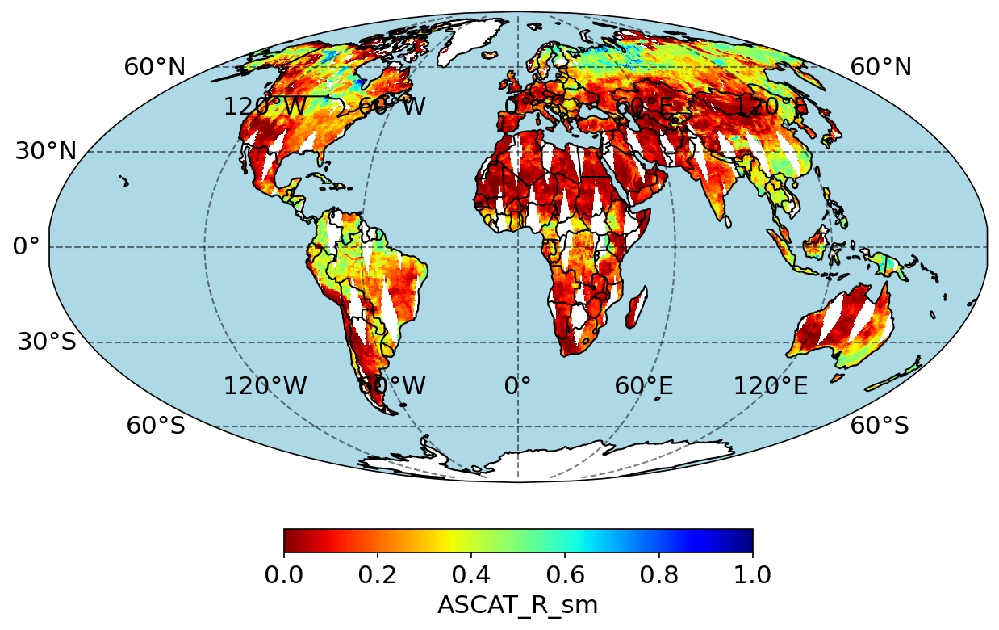

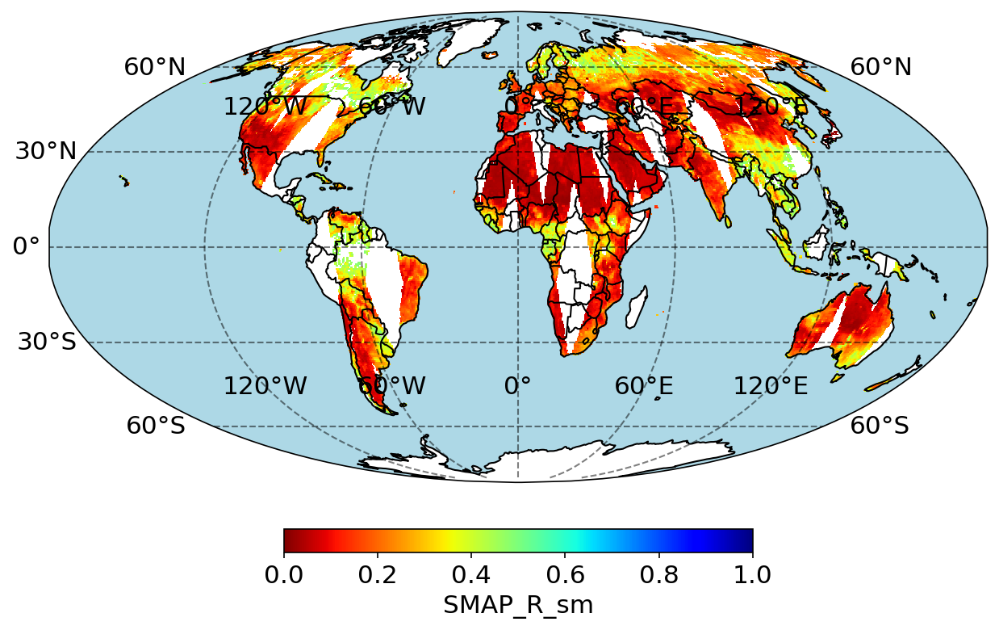

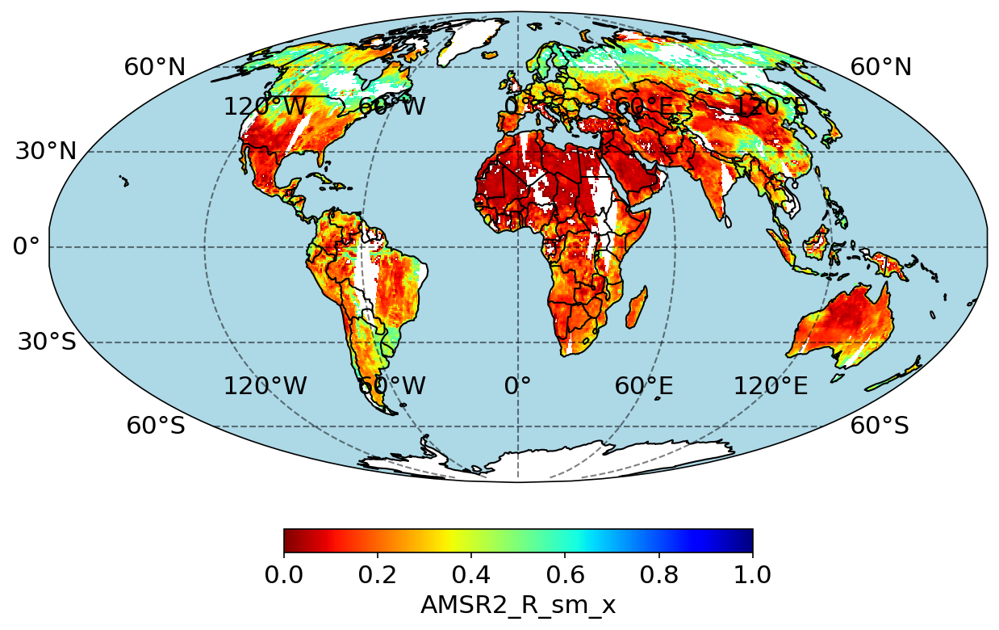

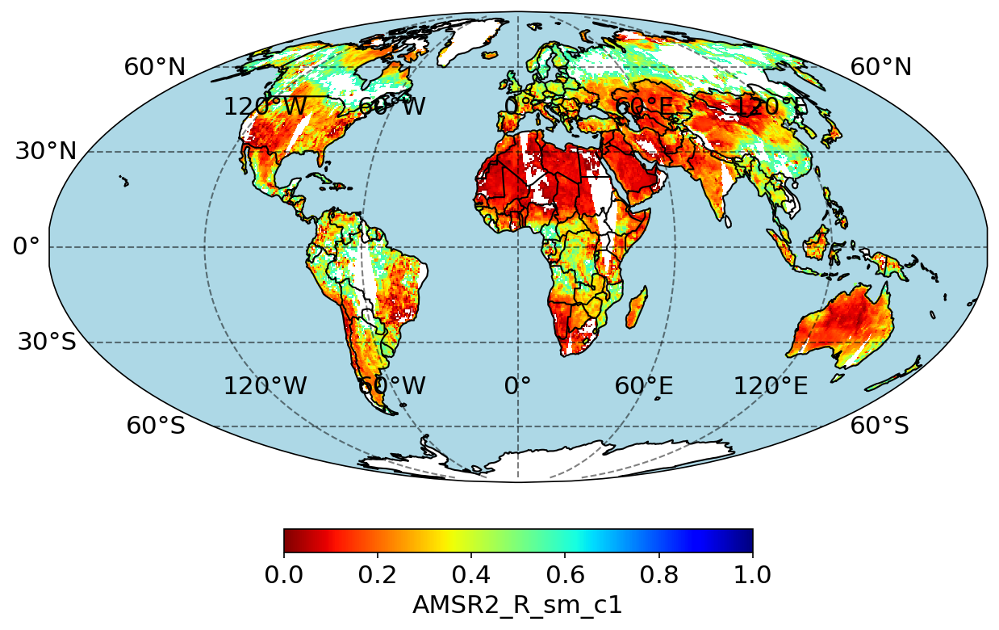

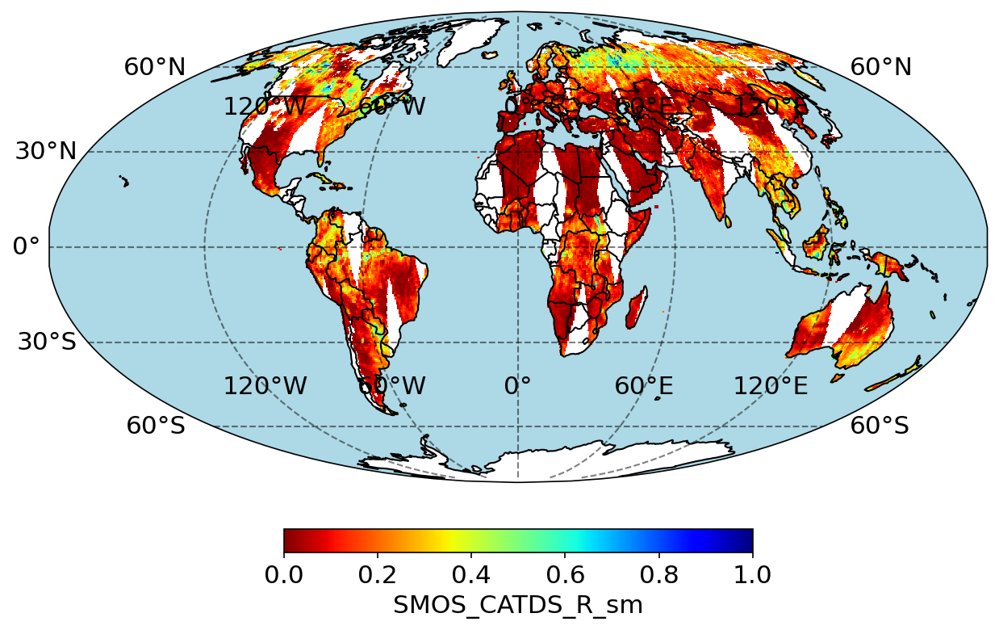

...

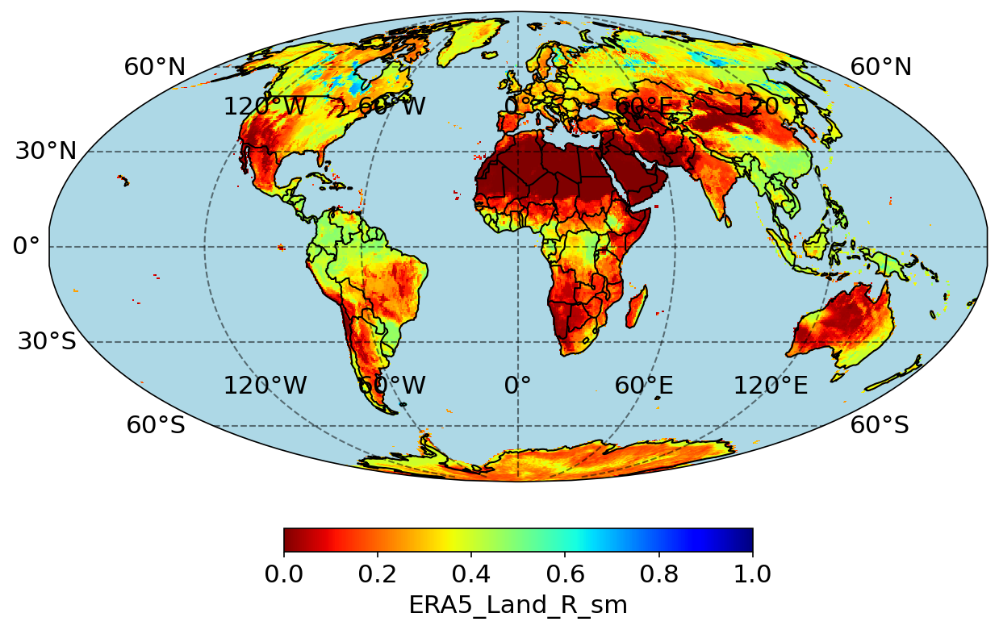

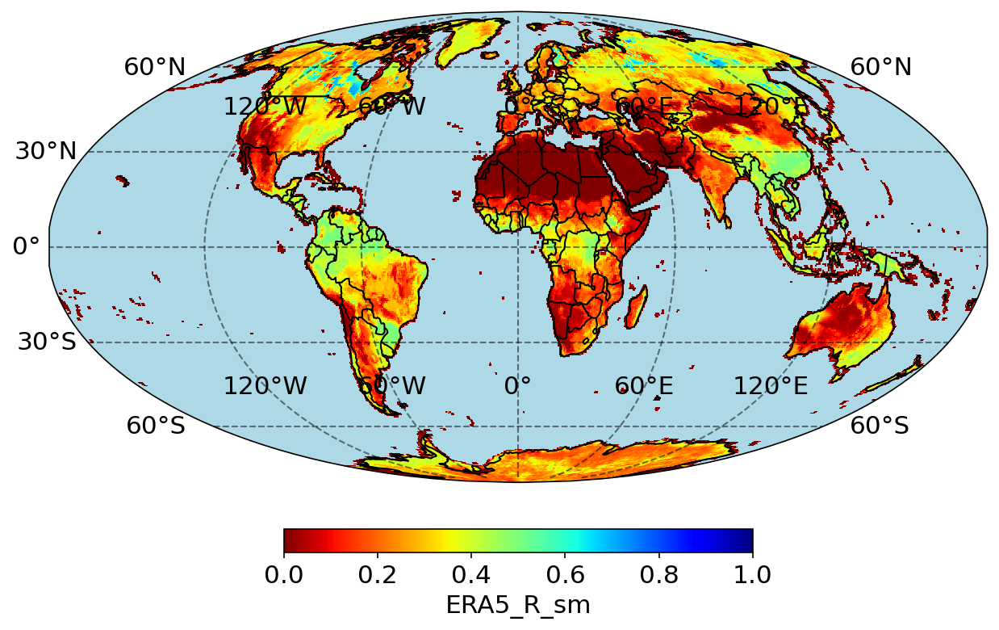

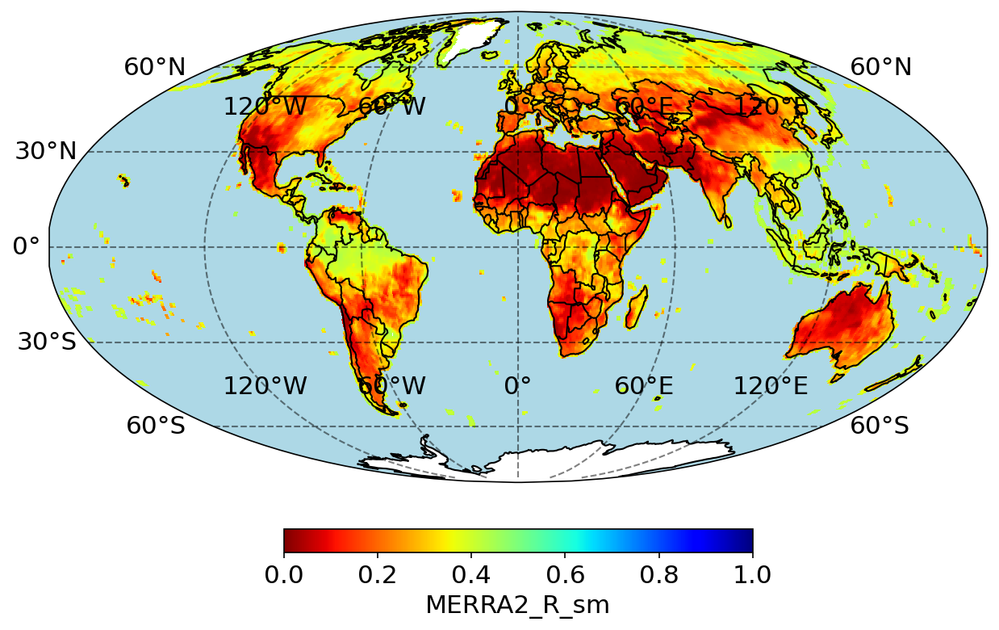

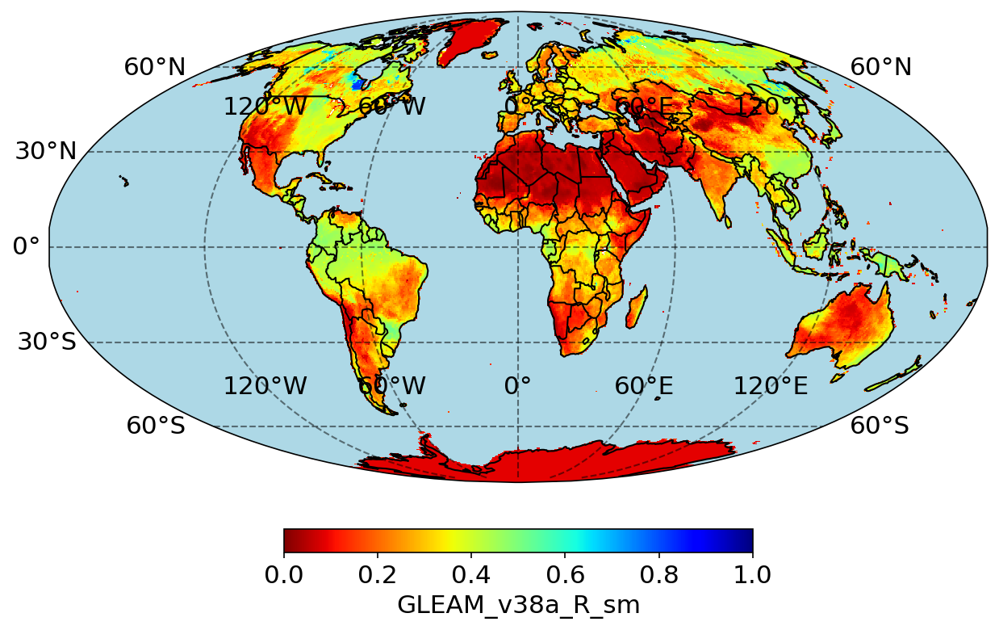

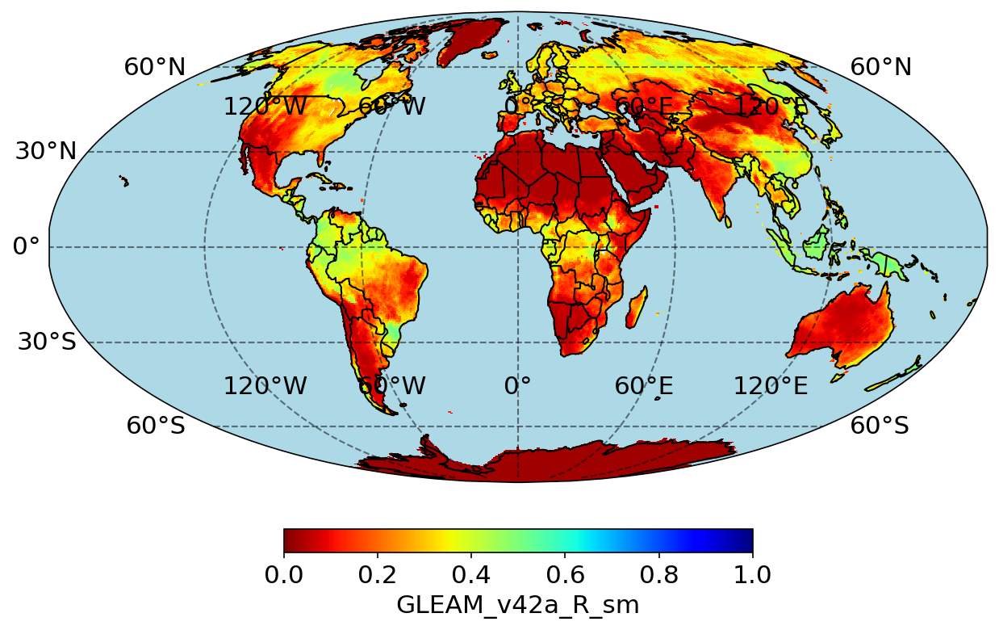


['GLDAS_Noah_R_et', 'GLDAS_VIC_R_et', 'ERA5_R_et', 'MERRA2_R_et', 'GLEAM_v38a_R_et', 'GLEAM_v42a_R_et', 'VISEA_R_et']


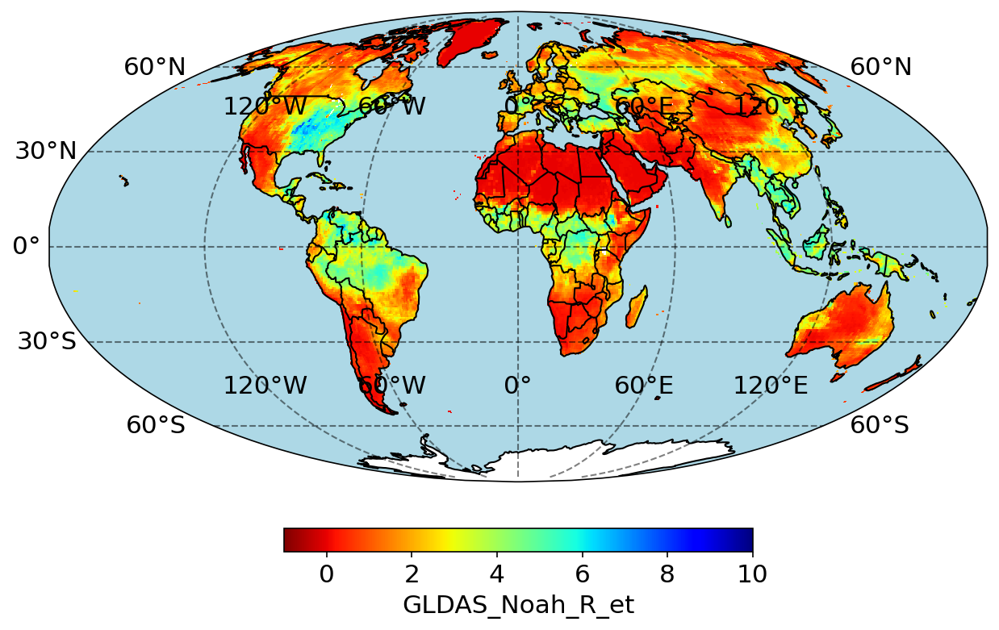

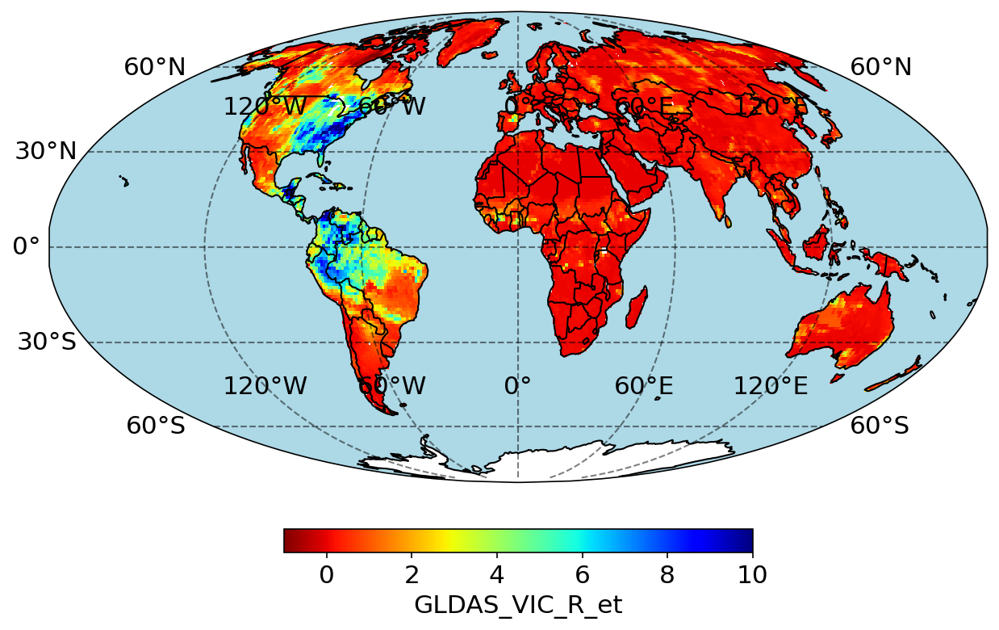

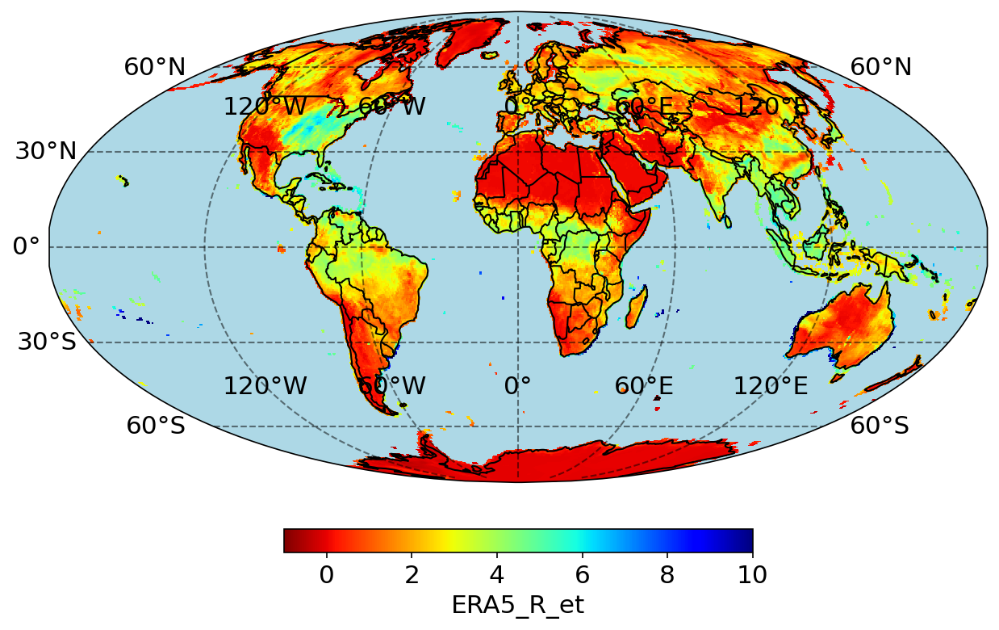

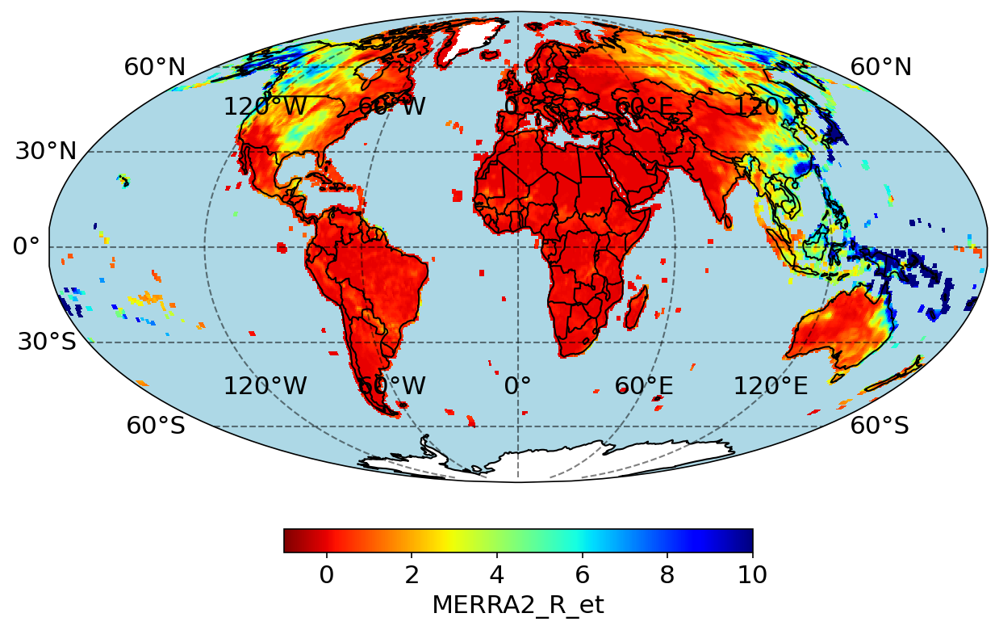

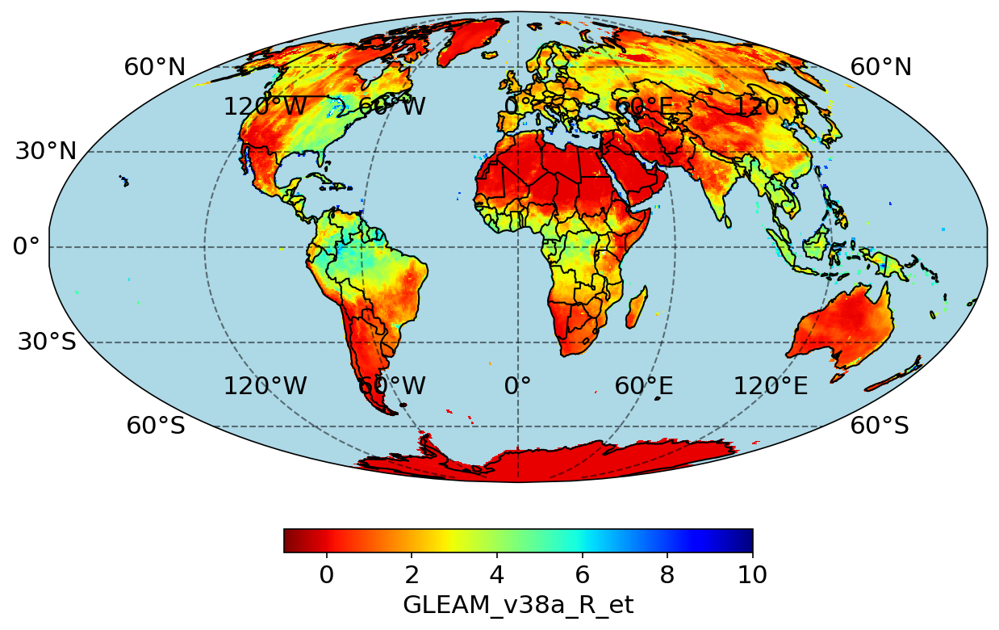

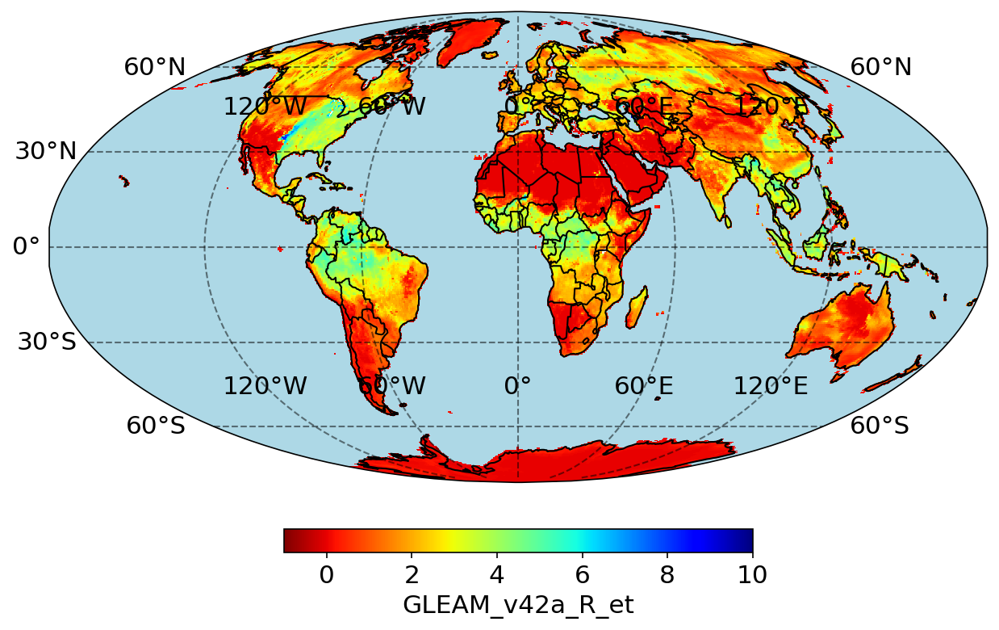

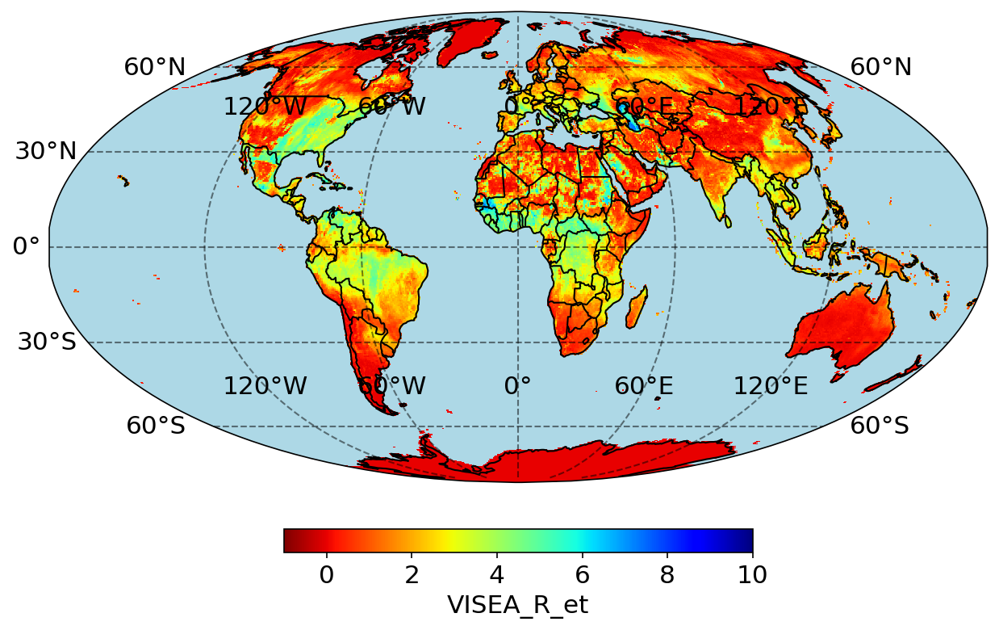

In [4]:
target_year = 2022
target_doy = 150
SM_path = f'{cpuserver_data_FP}/extracted_nc/projects/2025_KMA_050_grid/SM_{target_year}_R_eqd_050.nc'
with netCDF4.Dataset(SM_path) as nc_data:
    SM_var_list = list(nc_data.variables.keys())
    # Remove 'longitude', 'latitude'
    SM_var_list = [var for var in SM_var_list if var not in ['longitude', 'latitude']]
    print(SM_var_list)
    for var in SM_var_list:
        target = nc_data.variables[f'{var}'][:].data[:, :, target_doy]
        hPlot.plot_map(domain_lon, domain_lat, target, 0, 1, plot_title='-', label_title=f'{var}', cmap='jet_r')

print('='*100, '\n')

ET_path = f'{cpuserver_data_FP}/extracted_nc/projects/2025_KMA_050_grid/ET_{target_year}_R_eqd_050.nc'
with netCDF4.Dataset(ET_path) as nc_data:
    ET_var_list = list(nc_data.variables.keys())
    # Remove 'longitude', 'latitude'
    ET_var_list = [var for var in ET_var_list if var not in ['longitude', 'latitude']]
    print(ET_var_list)
    for var in ET_var_list:
        target = nc_data.variables[f'{var}'][:].data[:, :, target_doy]
        hPlot.plot_map(domain_lon, domain_lat, target, -1, 10, plot_title='-', label_title=f'{var}', cmap='jet_r')


(2, 48163)
(10,)


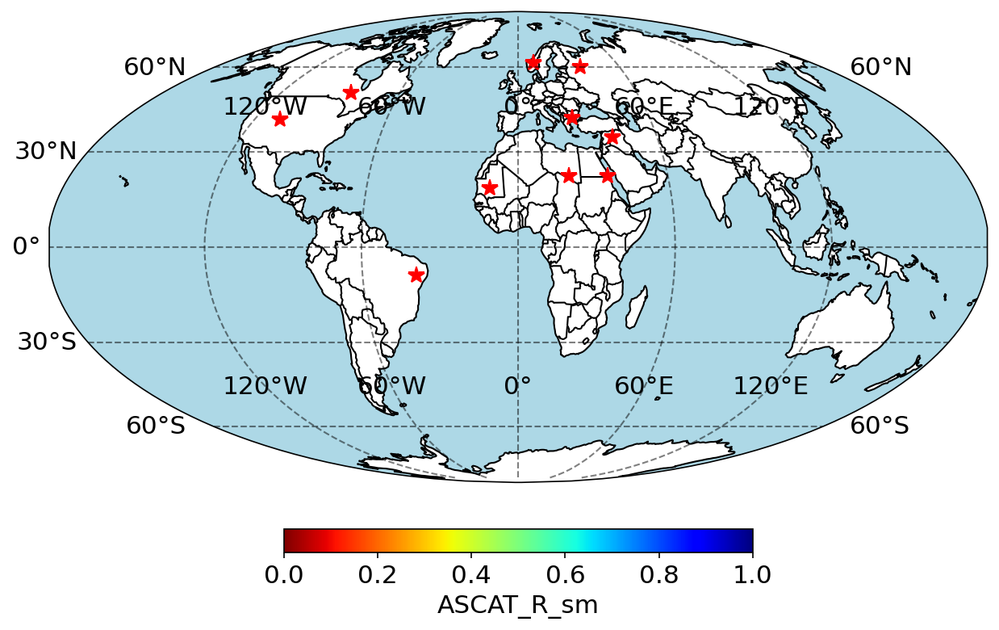

(<Figure size 1500x1500 with 2 Axes>, <GeoAxes: >)

In [5]:
# no-nan points
np.random.seed(1234)
with netCDF4.Dataset(SM_path) as nc_data:
    target = nc_data.variables[SM_var_list[0]][:].data[:, :, target_doy]
    no_nan_points = np.where(~np.isnan(target))
    print(np.shape(no_nan_points))

rand_idx = np.random.randint(0, np.shape(no_nan_points)[1], 10)
print(np.shape(rand_idx))
points_list = []
for idx in rand_idx:
    points_list.append([no_nan_points[0][idx], no_nan_points[1][idx]])

empty_full = np.full((np.shape(domain_lat)[0], np.shape(domain_lon)[1]), np.nan)
hPlot.plot_map(domain_lon, domain_lat, empty_full, 0, 1, plot_title='-', label_title=f'{SM_var_list[0]}', cmap='jet_r', points=points_list)


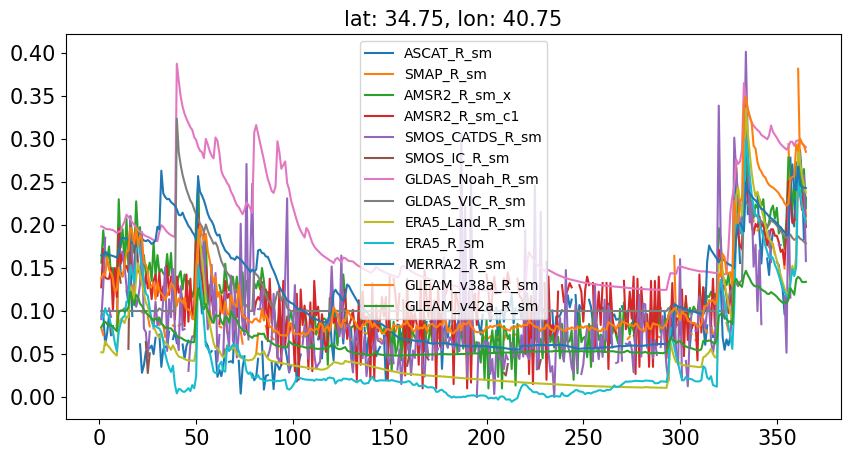

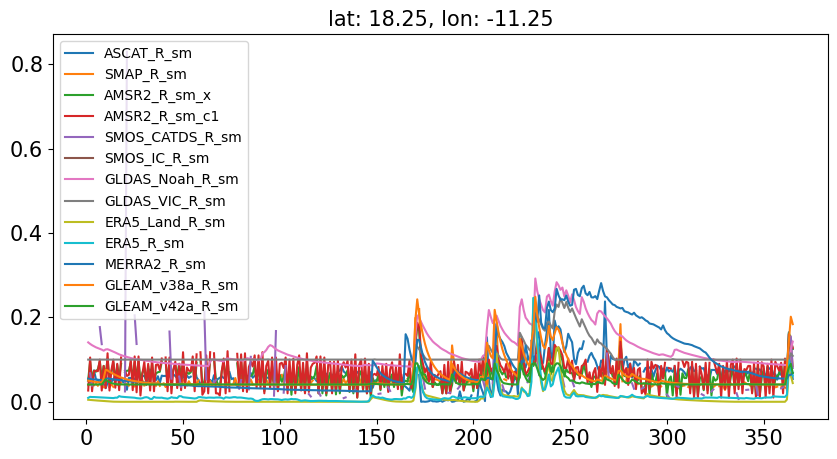

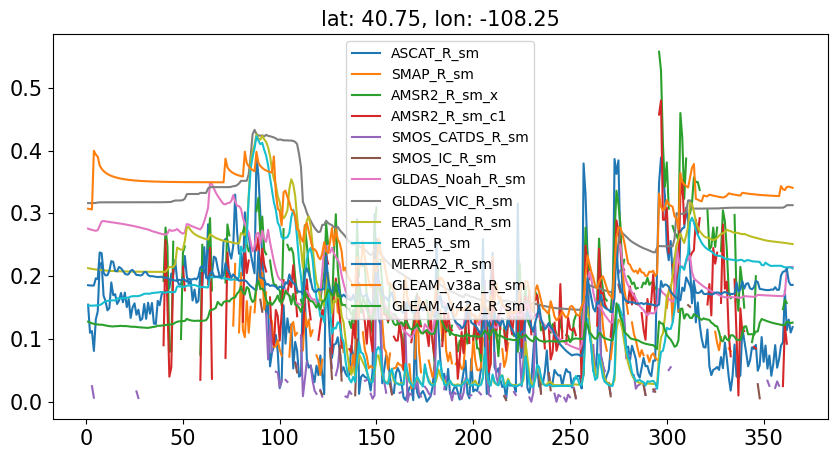

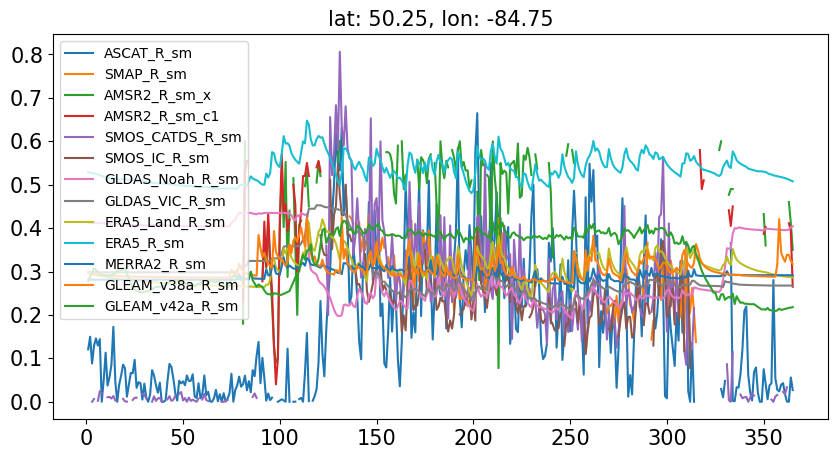

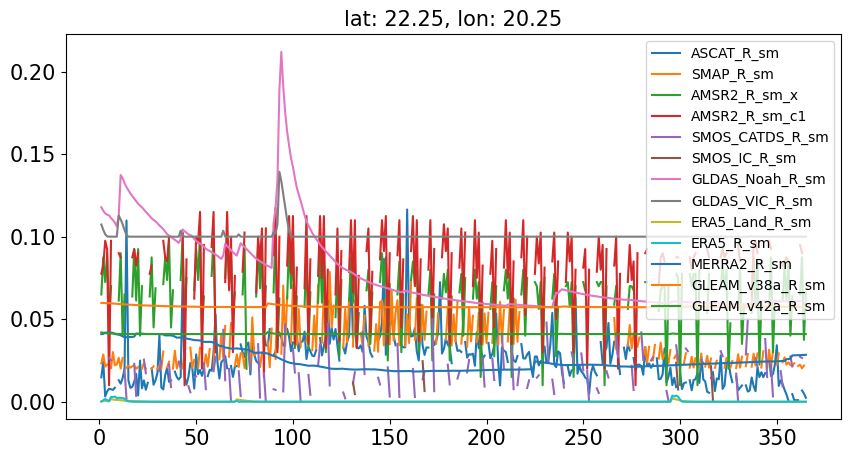

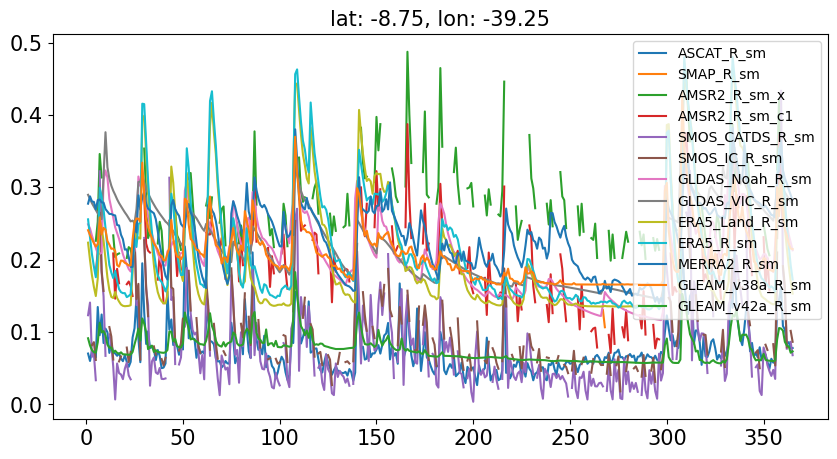

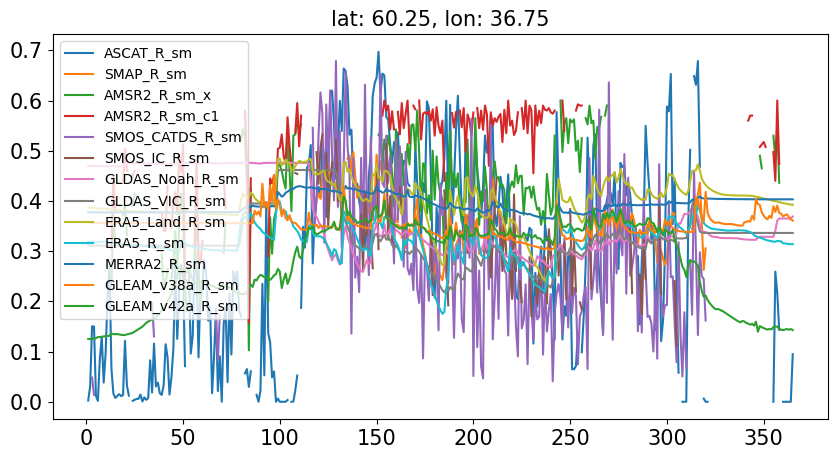

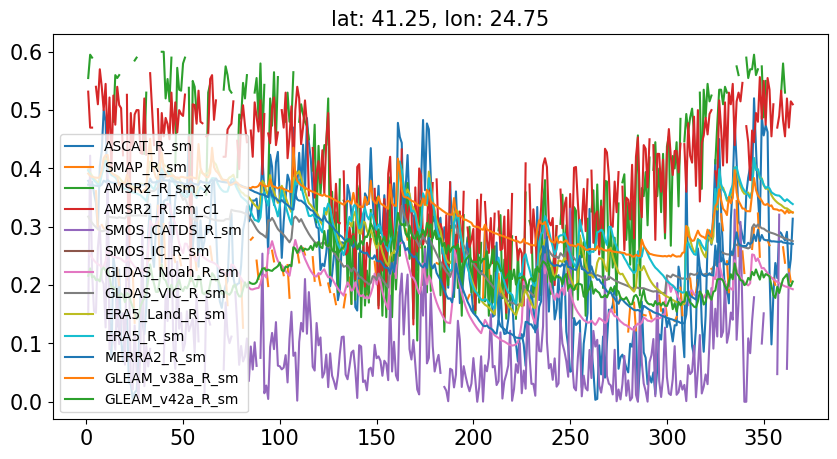

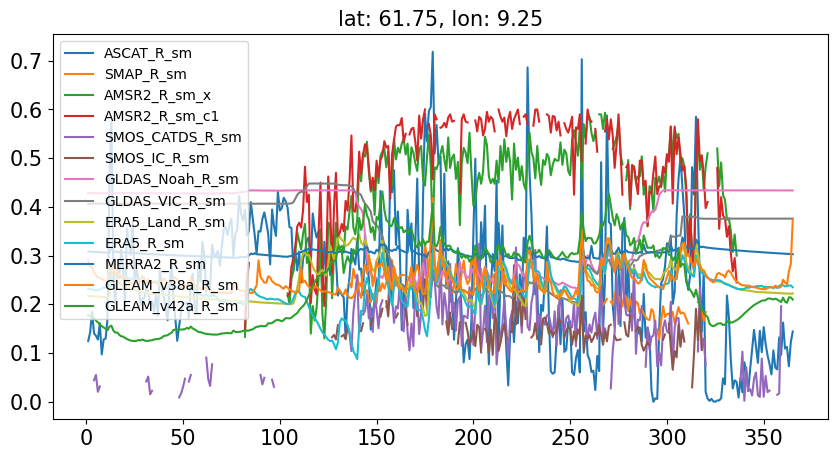

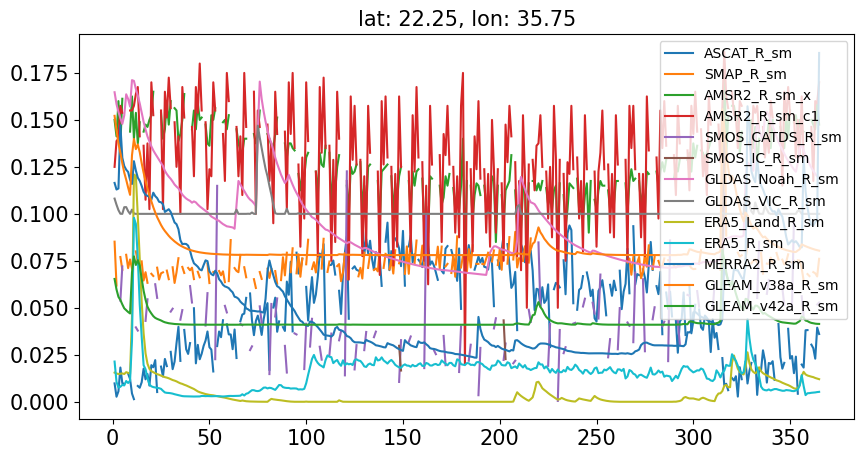

In [6]:
for idx in rand_idx:
    lat_idx, lon_idx = no_nan_points[0][idx], no_nan_points[1][idx]
    with netCDF4.Dataset(SM_path) as nc_data:
        plt.figure(figsize=(10, 5))

        for var in SM_var_list:
            target = nc_data.variables[f'{var}'][:].data[lat_idx, lon_idx, :]
            plt.plot(target)
        plt.legend(SM_var_list)
        plt.title(f'lat: {domain_lat[lat_idx, lon_idx]}, lon: {domain_lon[lat_idx, lon_idx]}')
        plt.show()

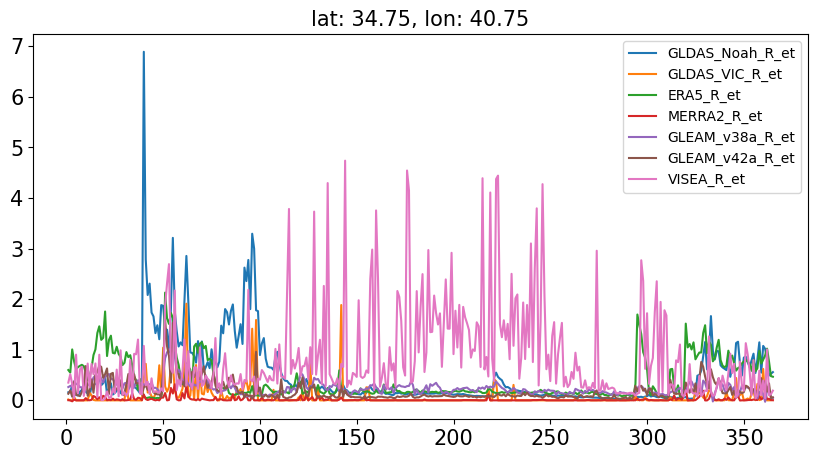

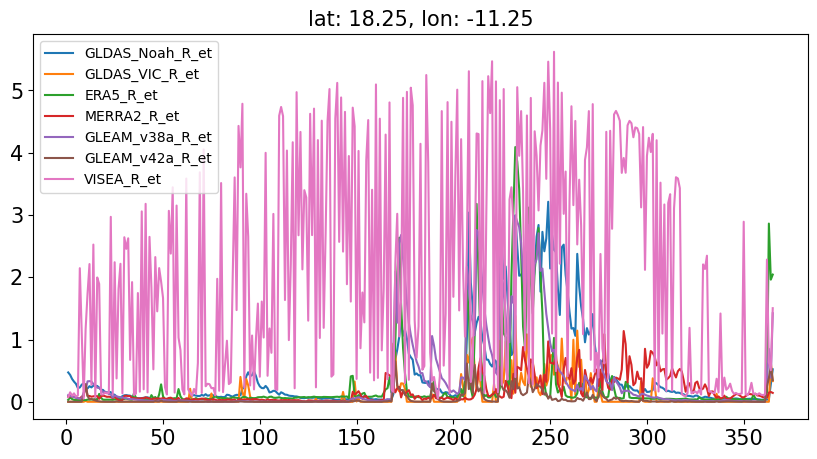

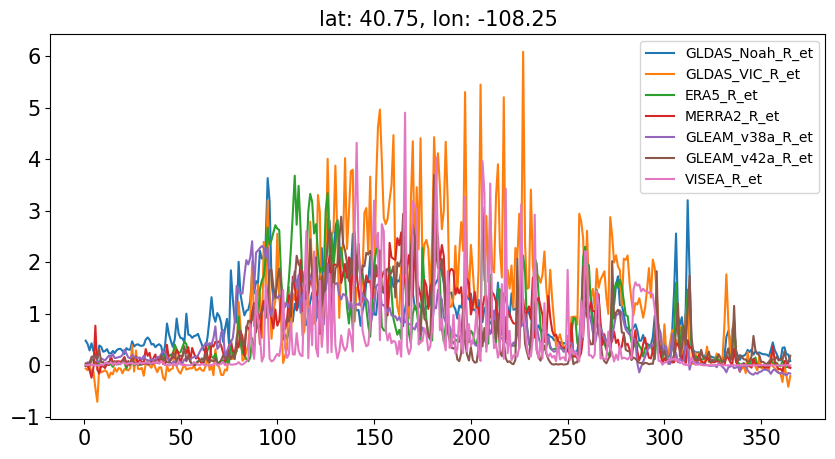

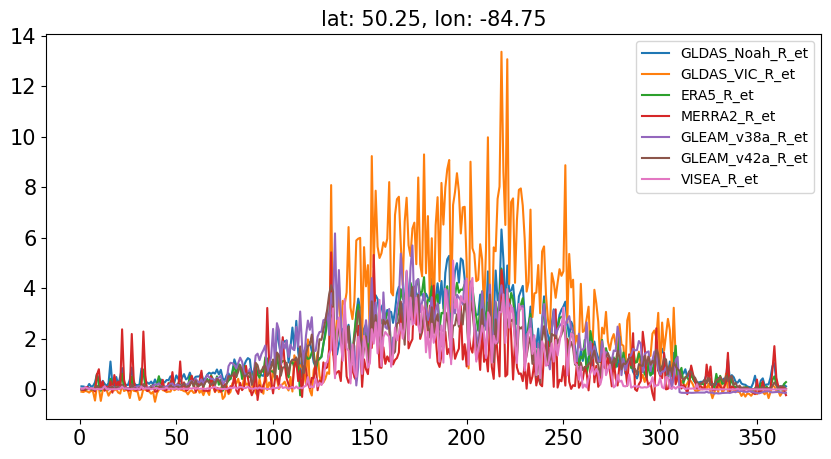

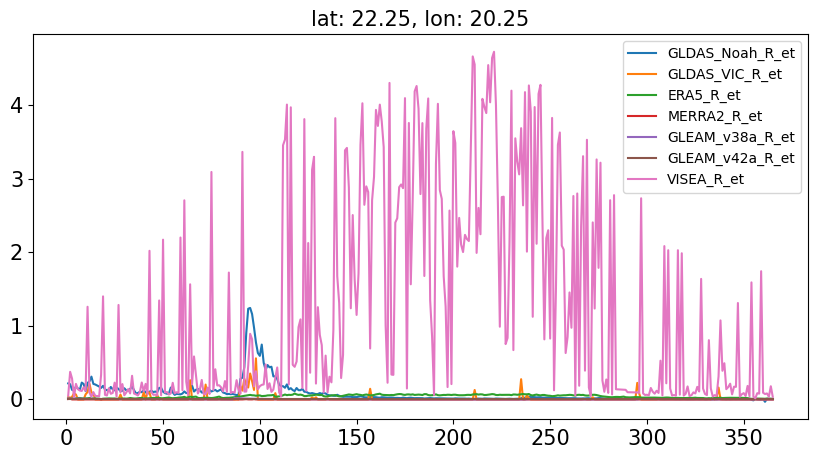

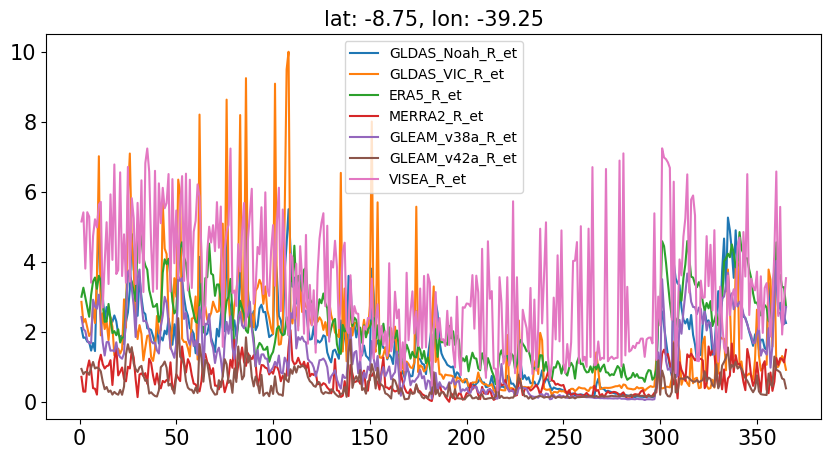

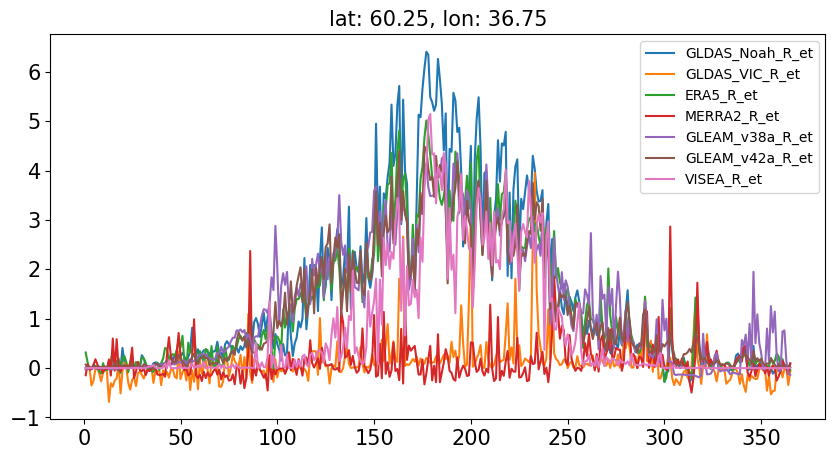

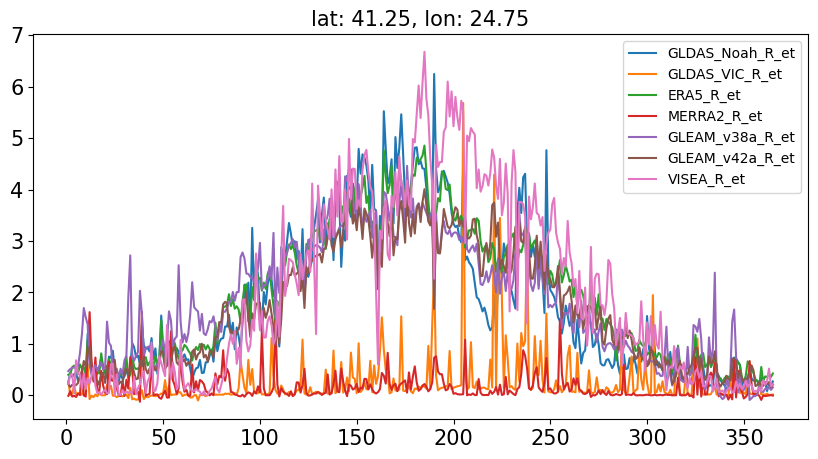

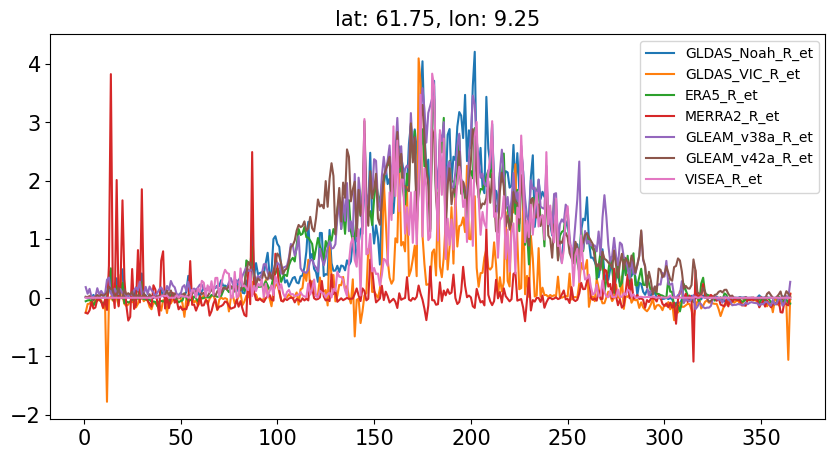

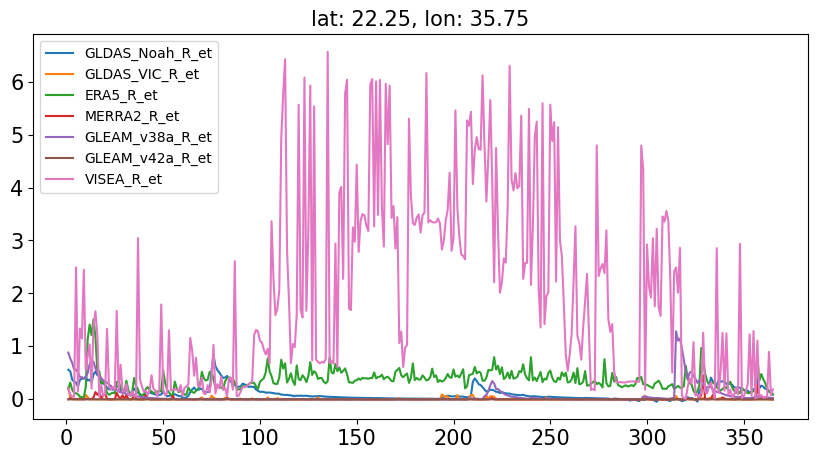

In [7]:
for idx in rand_idx:
    lat_idx, lon_idx = no_nan_points[0][idx], no_nan_points[1][idx]
    with netCDF4.Dataset(ET_path) as nc_data:
        plt.figure(figsize=(10, 5))

        for var in ET_var_list:
            target = nc_data.variables[f'{var}'][:].data[lat_idx, lon_idx, :]
            plt.plot(target)
        plt.legend(ET_var_list)
        plt.title(f'lat: {domain_lat[lat_idx, lon_idx]}, lon: {domain_lon[lat_idx, lon_idx]}')
        plt.show()